In [1]:
!pip install scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 2.3 MB/s eta 0:00:00


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import datetime as dt
import seaborn as sns

from sklearn.ensemble import RandomForestRegressor
from xgboost.sklearn import XGBRegressor

from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import make_scorer,mean_squared_error, mean_absolute_error, r2_score
from skopt import BayesSearchCV
plt.style.use('fivethirtyeight')

In [3]:
from google.colab import drive
drive.mount('/content/ggdrive')

Mounted at /content/ggdrive


In [4]:
df = pd.read_csv('/content/ggdrive/MyDrive/NCKH - Air quality/data/PRSA_Data_Aotizhongxin_20130301-20170228.csv')
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [5]:
df_copy = df.copy()
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34139 non-null  float64
 6   PM10     34346 non-null  float64
 7   SO2      34129 non-null  float64
 8   NO2      34041 non-null  float64
 9   CO       33288 non-null  float64
 10  O3       33345 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [6]:
pd.DataFrame(((df_copy.isnull().sum()/len(df_copy))*100)).sort_values(by=0, ascending = False)

,0
CO,5.065024
O3,4.902464
NO2,2.917522
SO2,2.666553
PM2.5,2.638033
PM10,2.047684
wd,0.231006
PRES,0.057039
RAIN,0.057039
DEWP,0.057039


In [7]:
df_copy['wd'].unique()

array(['NNW', 'N', 'NW', 'NNE', 'ENE', 'E', 'NE', 'W', 'SSW', 'WSW', 'SE',
       'WNW', 'SSE', 'ESE', 'S', 'SW', nan], dtype=object)

# **DATA ANALYSIS**

### 1. Data distribution





In [8]:
df_copy[[col for col in df.columns if col not in ['No',	'year',	'month', 'day',	'hour', 'station']]].describe()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,34139.000000,34346.000000,34129.000000,34041.000000,33288.000000,33345.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,82.773611,110.060391,17.375901,59.305833,1262.945145,56.353358,13.584607,1011.846920,3.123062,0.067421,1.708496
std,82.135694,95.223005,22.823017,37.116200,1221.436236,57.916327,11.399097,10.404047,13.688896,0.910056,1.204071
min,3.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-16.800000,985.900000,-35.300000,0.000000,0.000000
25%,22.000000,38.000000,3.000000,30.000000,500.000000,8.000000,3.100000,1003.300000,-8.100000,0.000000,0.900000
50%,58.000000,87.000000,9.000000,53.000000,900.000000,42.000000,14.500000,1011.400000,3.800000,0.000000,1.400000
75%,114.000000,155.000000,21.000000,82.000000,1500.000000,82.000000,23.300000,1020.100000,15.600000,0.000000,2.200000
max,898.000000,984.000000,341.000000,290.000000,10000.000000,423.000000,40.500000,1042.000000,28.500000,72.500000,11.200000


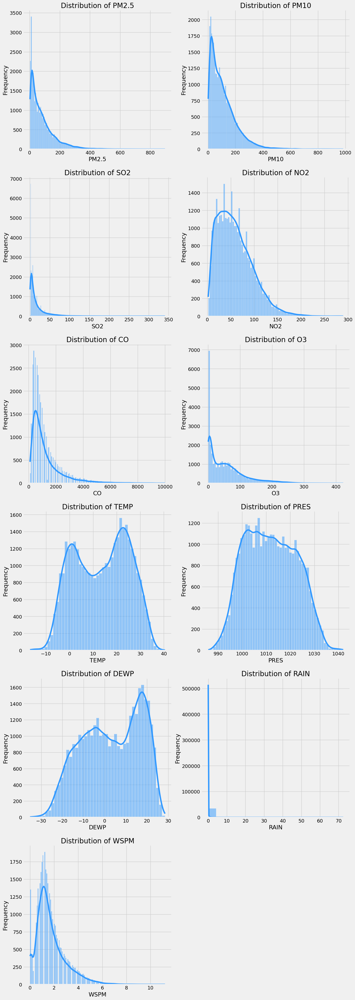

In [9]:
column = [col for col in df_copy.columns if col not in ['No',	'year',	'month', 'day',	'hour', 'station', 'wd']]
num_rows_num = (len(column) - 1) // 2 + 1

# Create subplots and hisplot for attributes
plt.figure(figsize=(15, 8 * num_rows_num))
for i, attr in enumerate(column):
    plt.subplot(num_rows_num, 2, i + 1)
    sns.histplot(df_copy[attr], kde=True, color='#3299ff')
    plt.xlabel(attr)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {attr}')

### 2. Data Treding

In [10]:
def create_time_features(df):
  df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
  df['date of week'] = df['datetime'].dt.day_of_week
  df['week of month'] = df['datetime'].dt.isocalendar().week
  return df

In [11]:
df_copy = create_time_features(df_copy)
df_copy = df_copy.set_index('datetime')

#### Year Trending

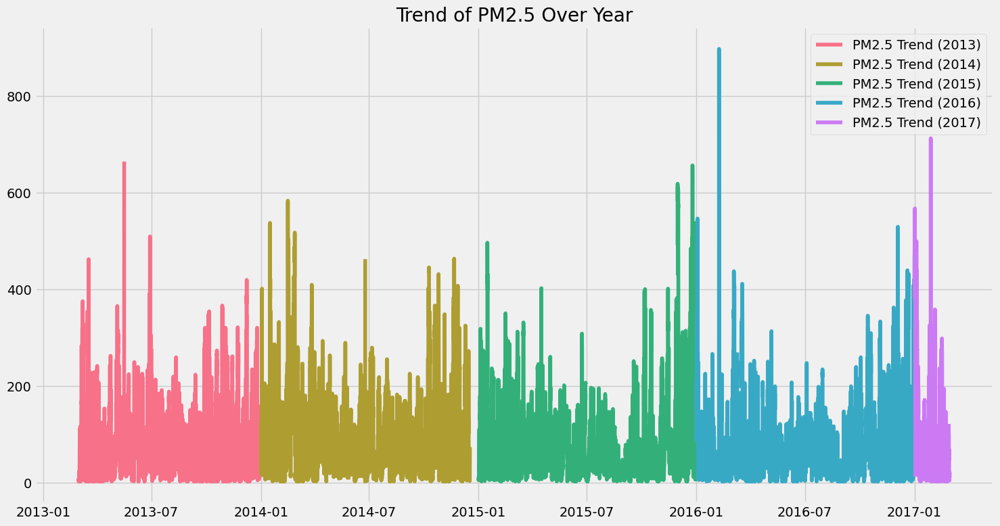

In [12]:
# Sử dụng Seaborn để gán màu sắc khác nhau cho mỗi năm
palette = sns.color_palette('husl', n_colors=len(df_copy['year'].unique()))
plt.figure(figsize=(15, 8))

# Vẽ từng năm với màu sắc tương ứng
for year, color in zip(df_copy['year'].unique(), palette):
    year_data = df_copy[df_copy['year'] == year]
    plt.plot(year_data.index, year_data['PM2.5'], label=f'PM2.5 Trend ({year})', color=color)

plt.title(f'Trend of PM2.5 Over Year')
plt.tight_layout()
plt.grid(True)
plt.legend()
plt.show()

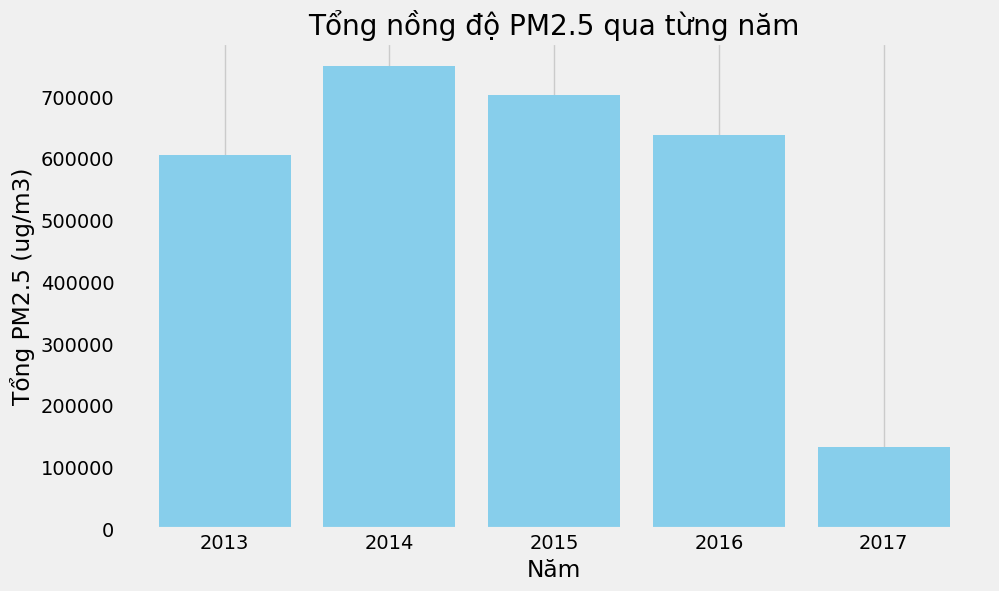

In [13]:
total_pm25_per_year = df_copy.groupby('year')['PM2.5'].sum()
plt.figure(figsize=(10, 6))
plt.bar(total_pm25_per_year.index, total_pm25_per_year.values, color='skyblue')
plt.title('Tổng nồng độ PM2.5 qua từng năm')
plt.xlabel('Năm')
plt.ylabel('Tổng PM2.5 (ug/m3)')
plt.grid(axis='y')
plt.show()

#### Month Trending

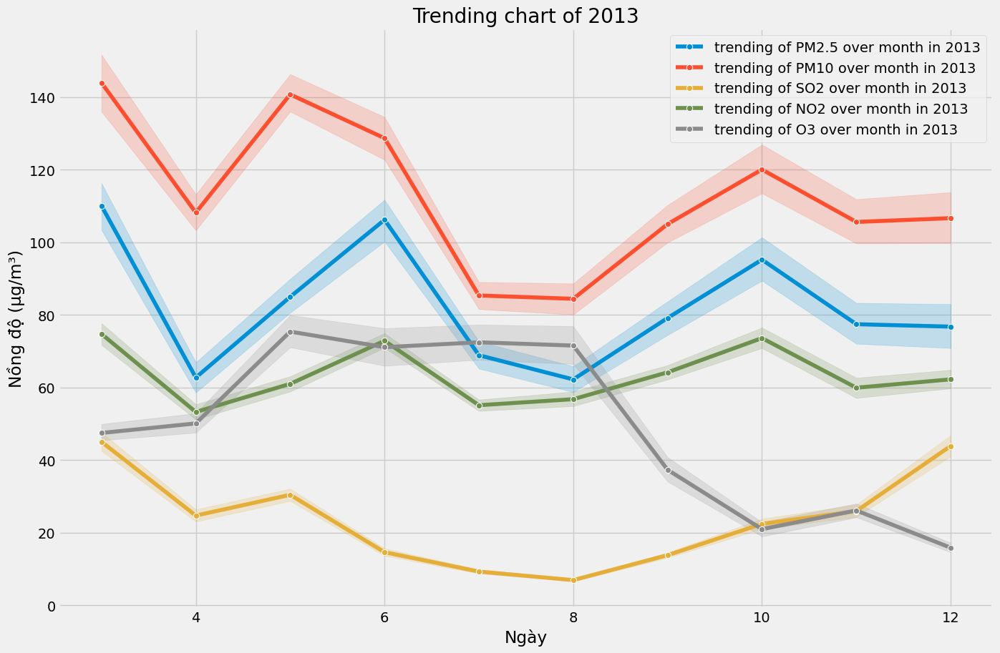

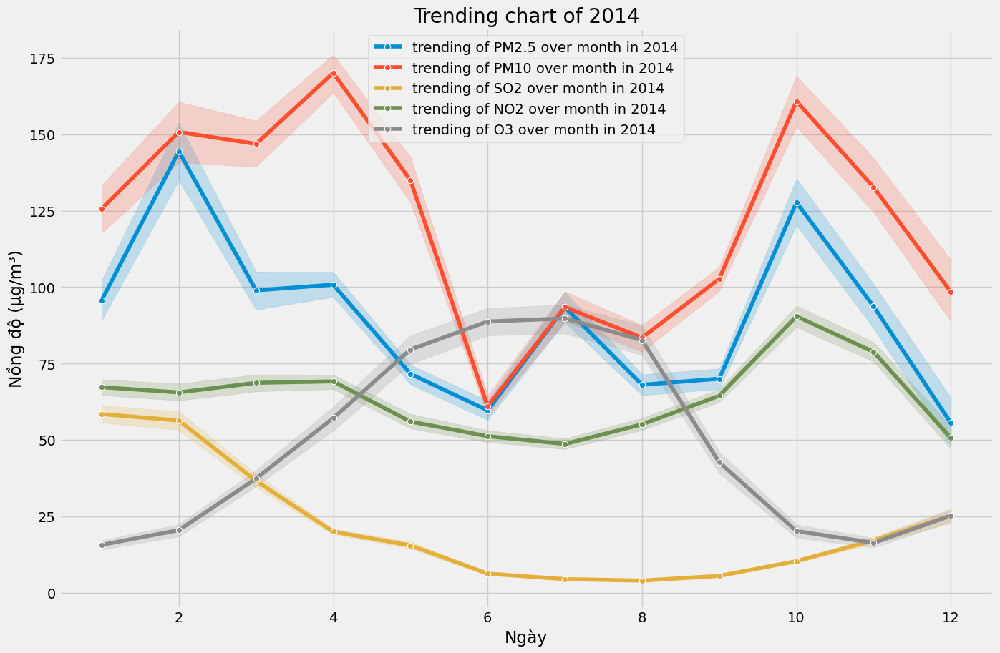

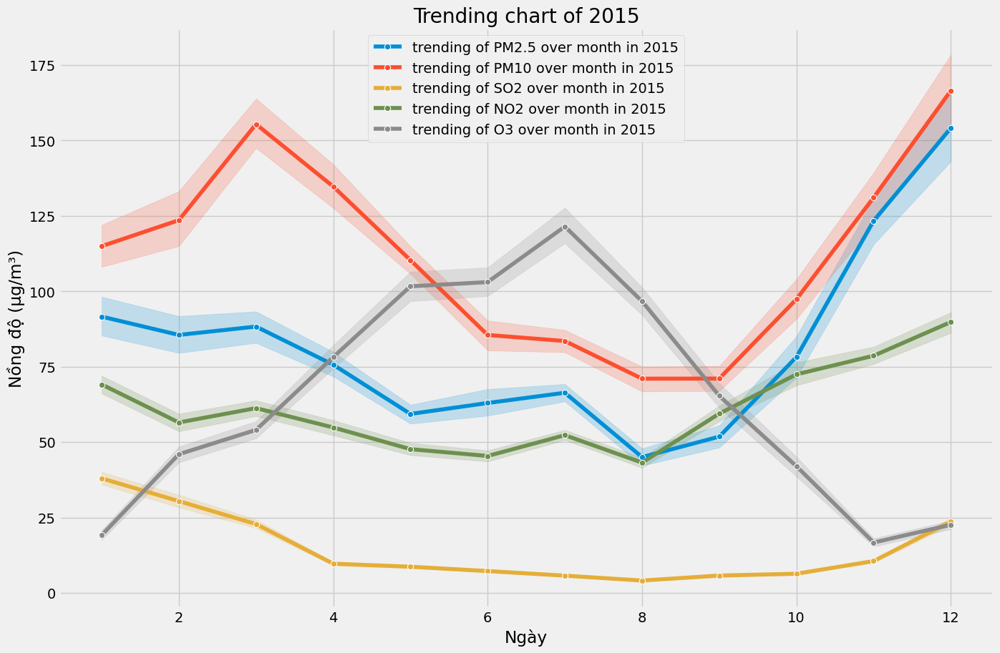

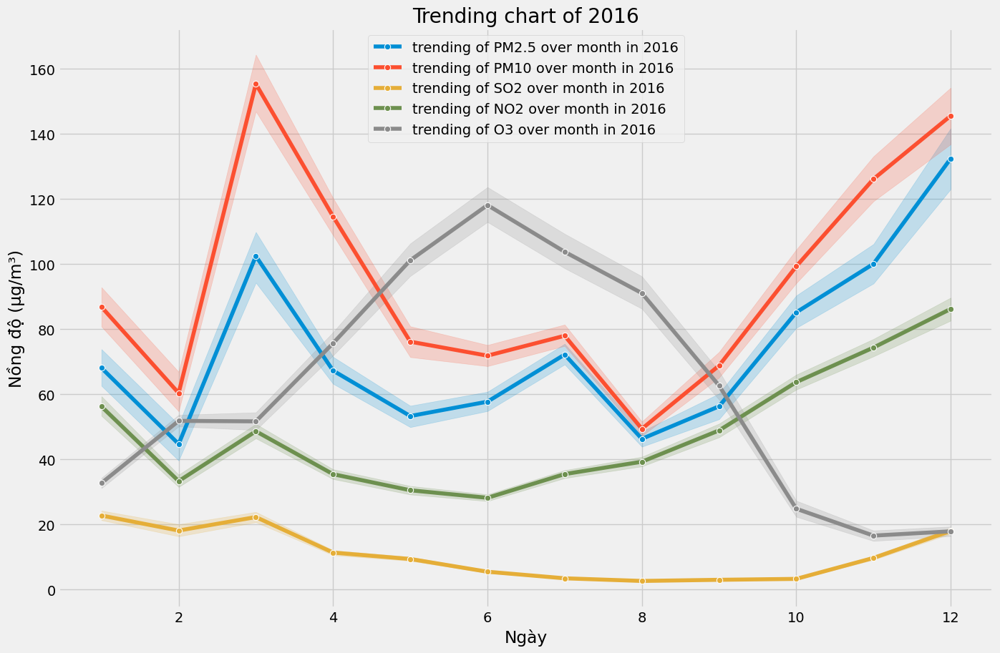

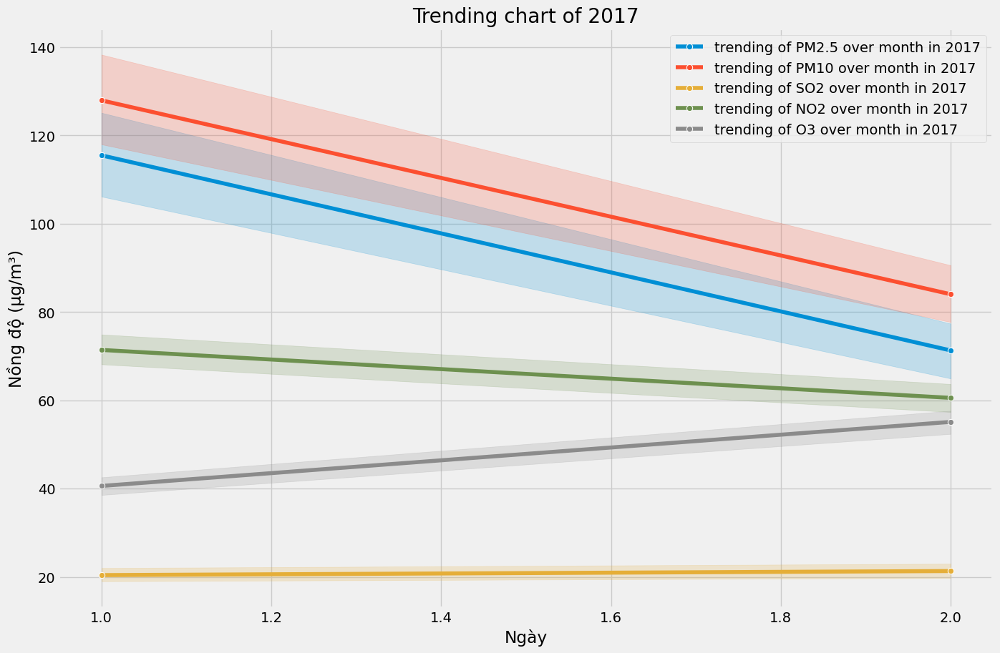

In [14]:
column = ['PM2.5', 'PM10', 'SO2', 'NO2', 'O3']

for year in df_copy['year'].unique():
  selected_year = year
  # Lọc dữ liệu cho năm cụ thể
  selected_data = df_copy[df_copy['year'] == selected_year]

  # Tạo biểu đồ từng năm
  plt.figure(figsize=(15, 10))

  for col in column:
    # Sử dụng seaborn để vẽ biểu đồ line plot
    sns.lineplot(x='month', y=col, data=selected_data, marker='o', label = f'trending of {col} over month in {selected_year}')

  # Các cài đặt biểu đồ
  plt.title(f'Trending chart of {selected_year}')
  plt.xlabel('Ngày')
  plt.ylabel('Nồng độ (µg/m³)')
  plt.grid(True)
  plt.legend()
  plt.show()

#### Week trending

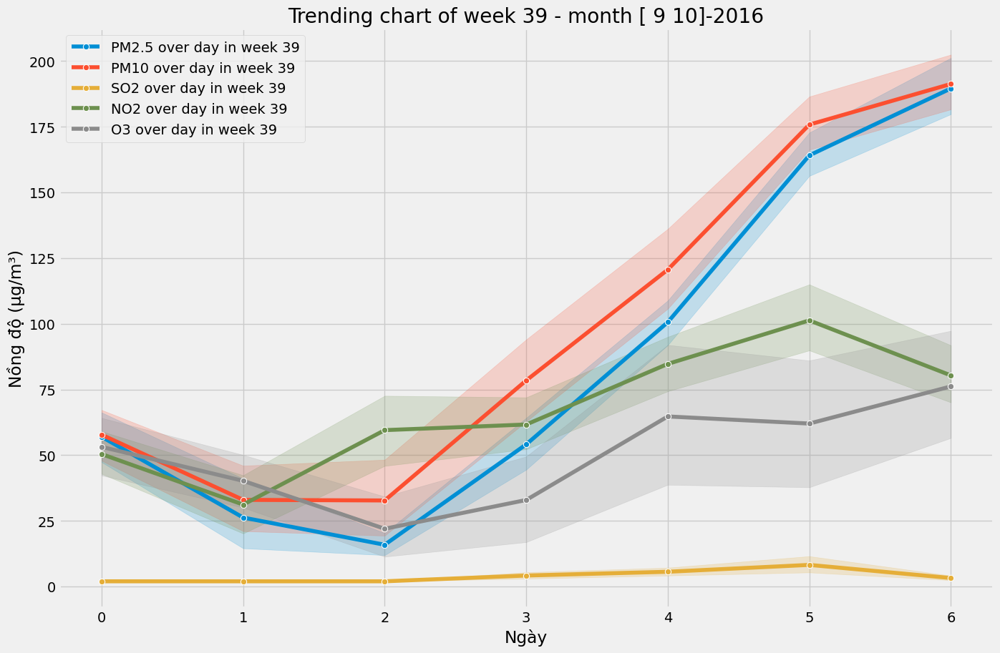

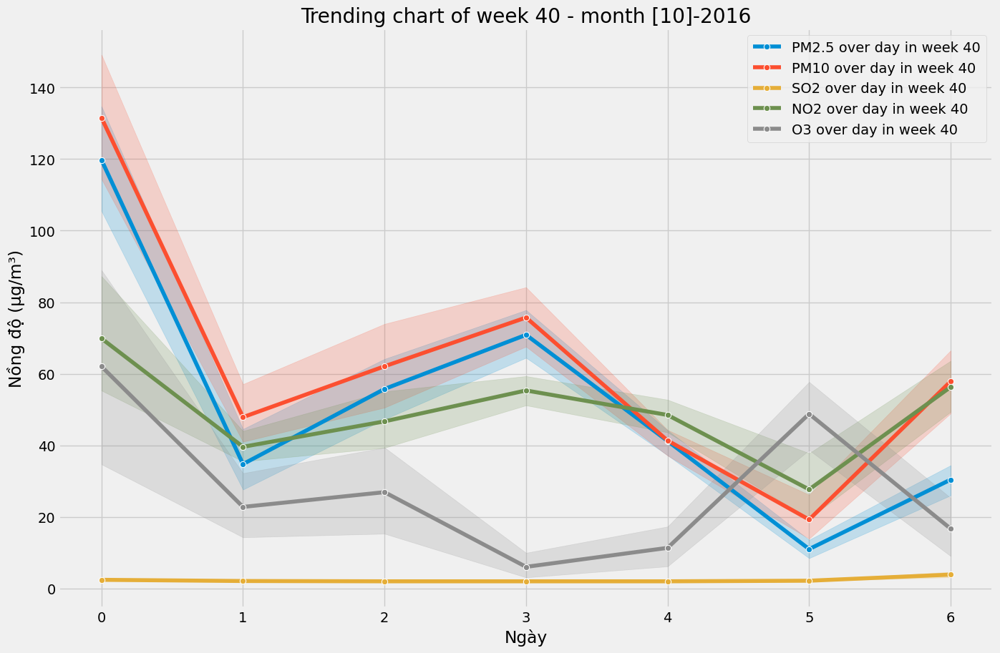

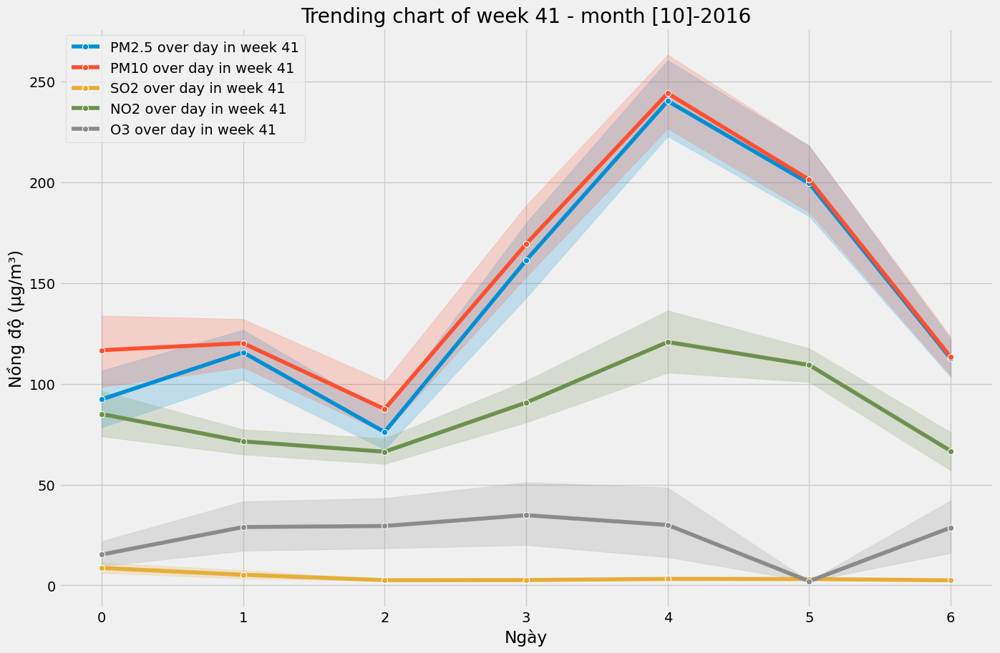

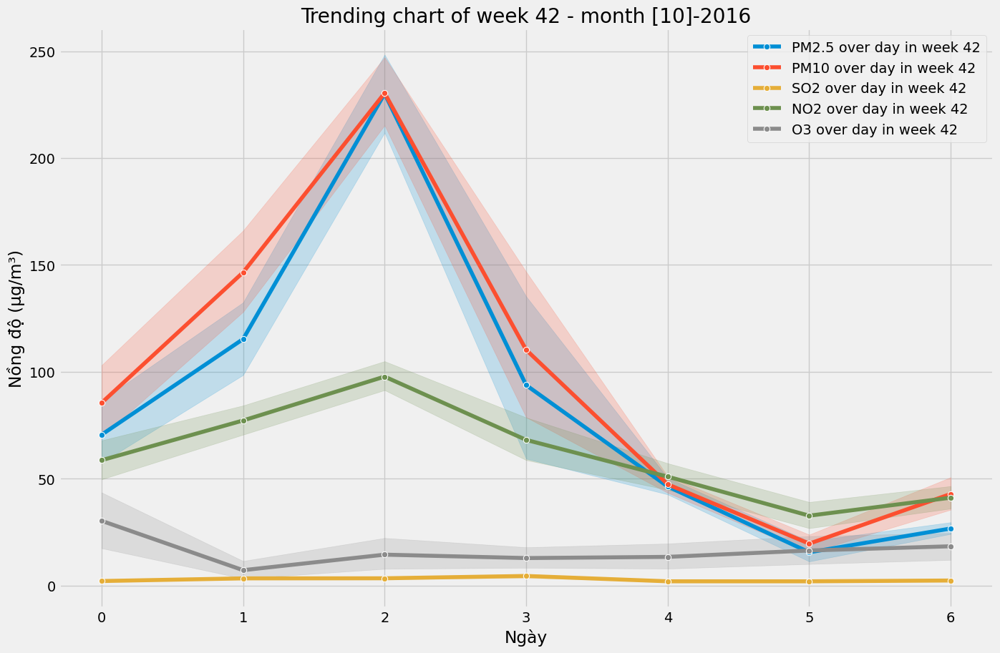

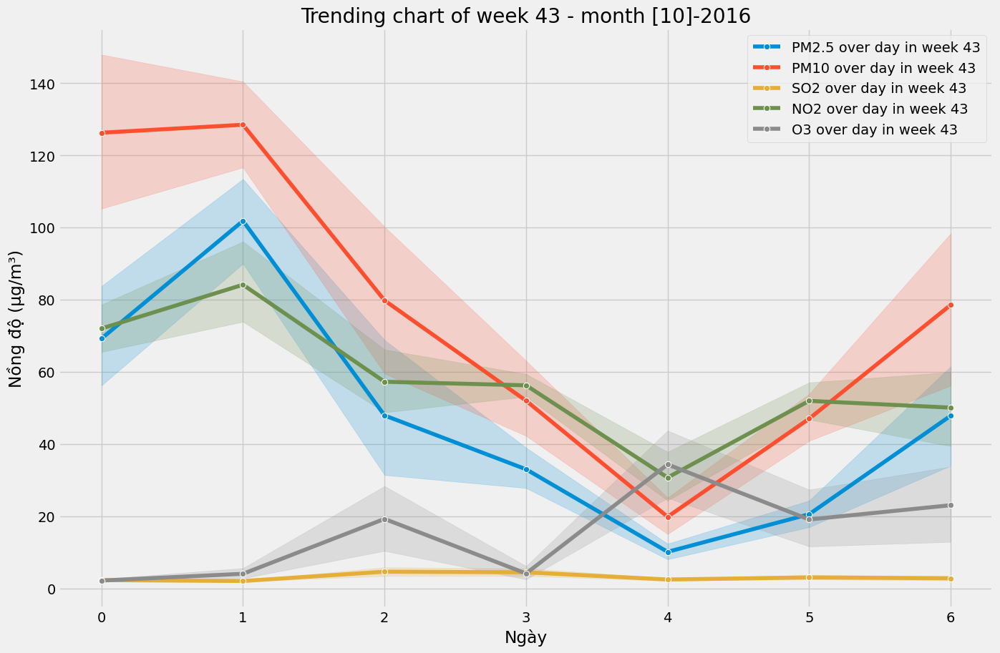

...

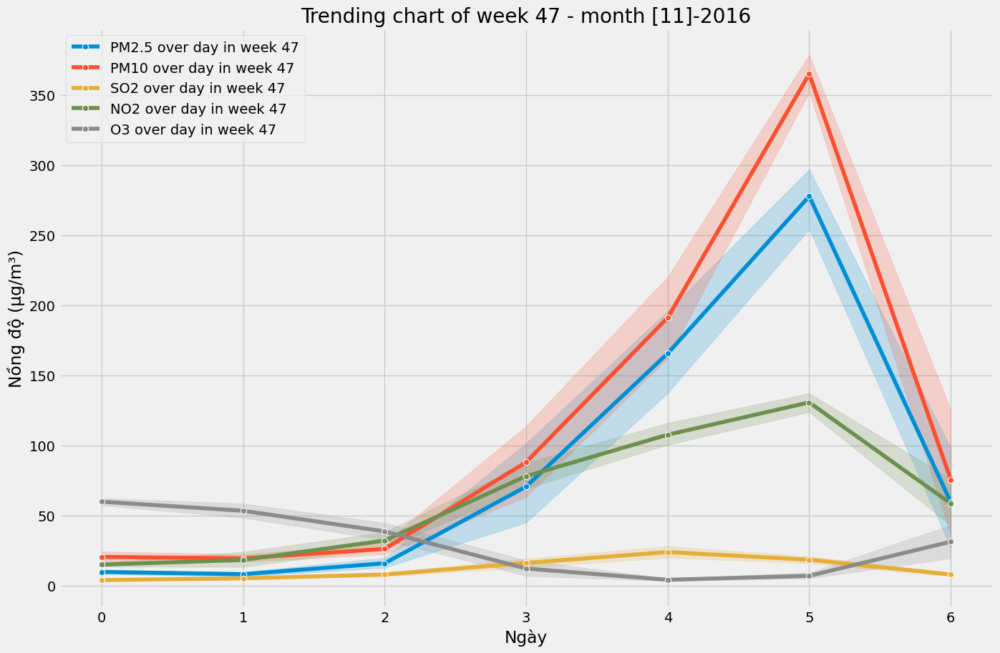

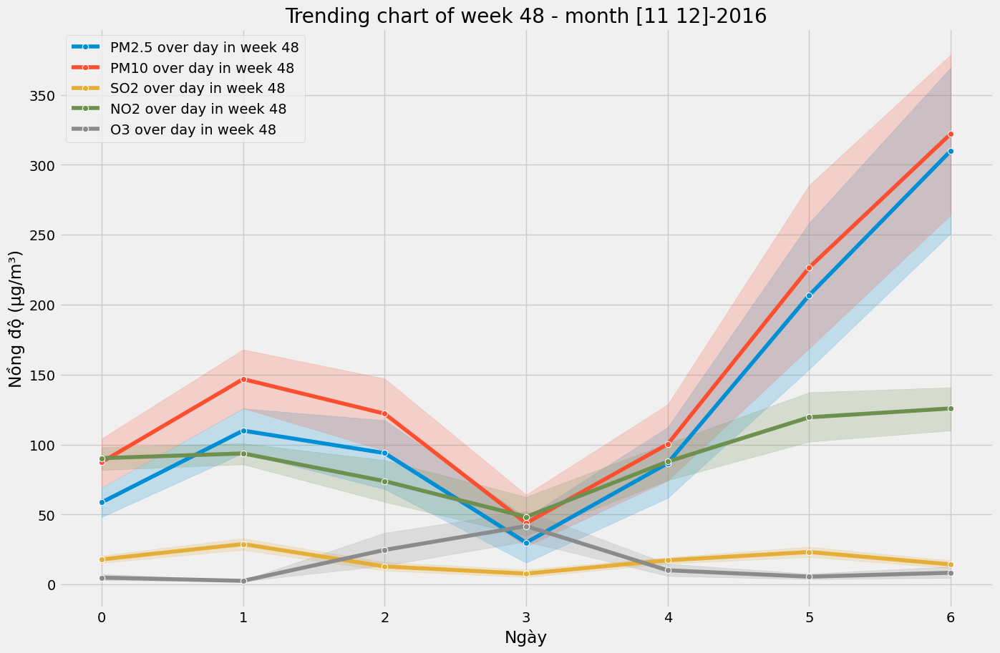

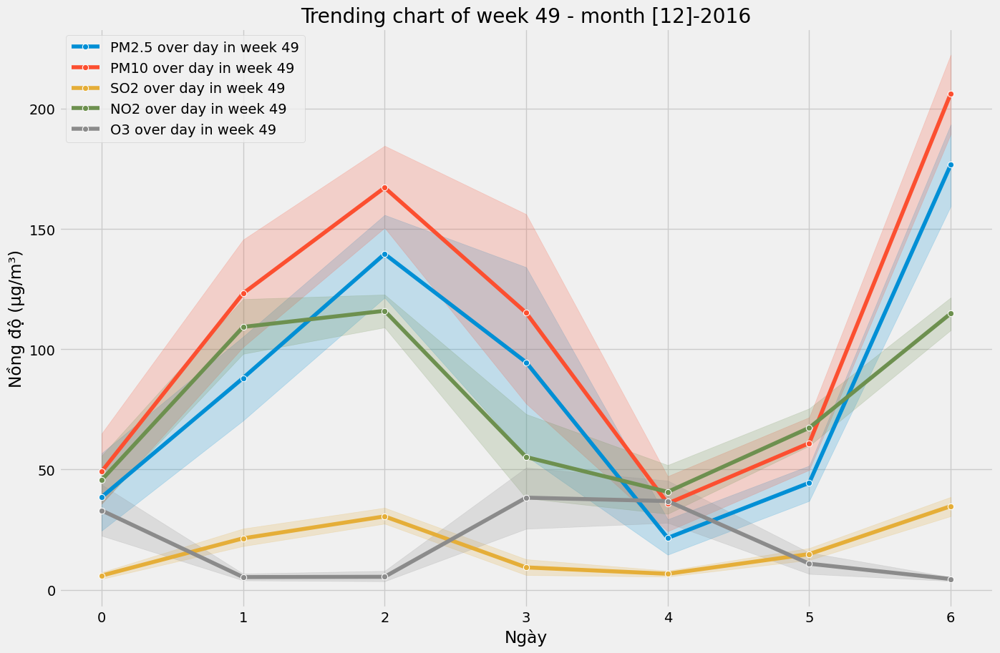

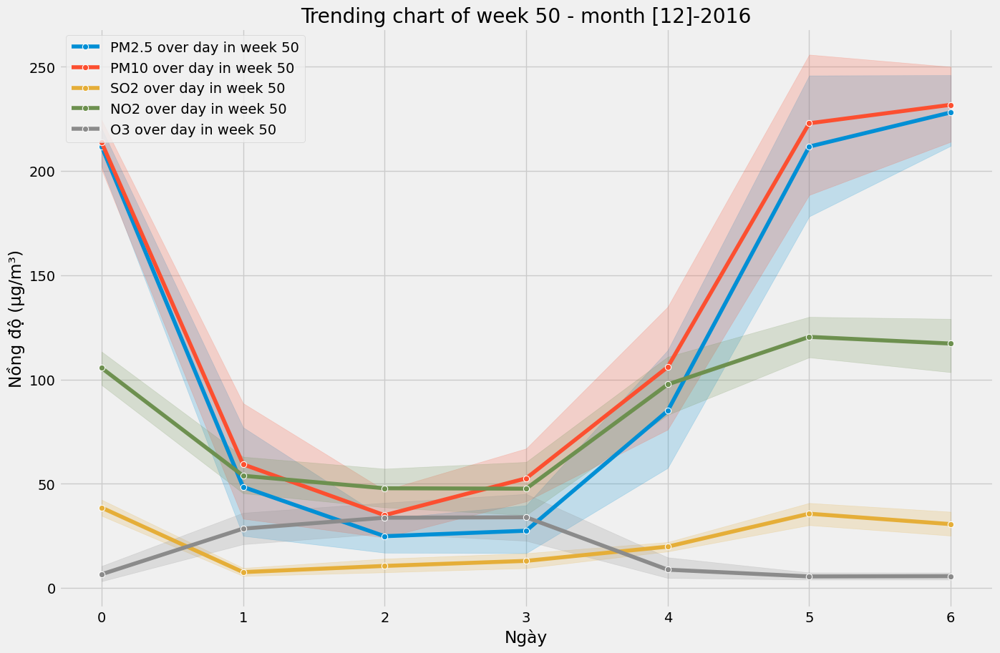

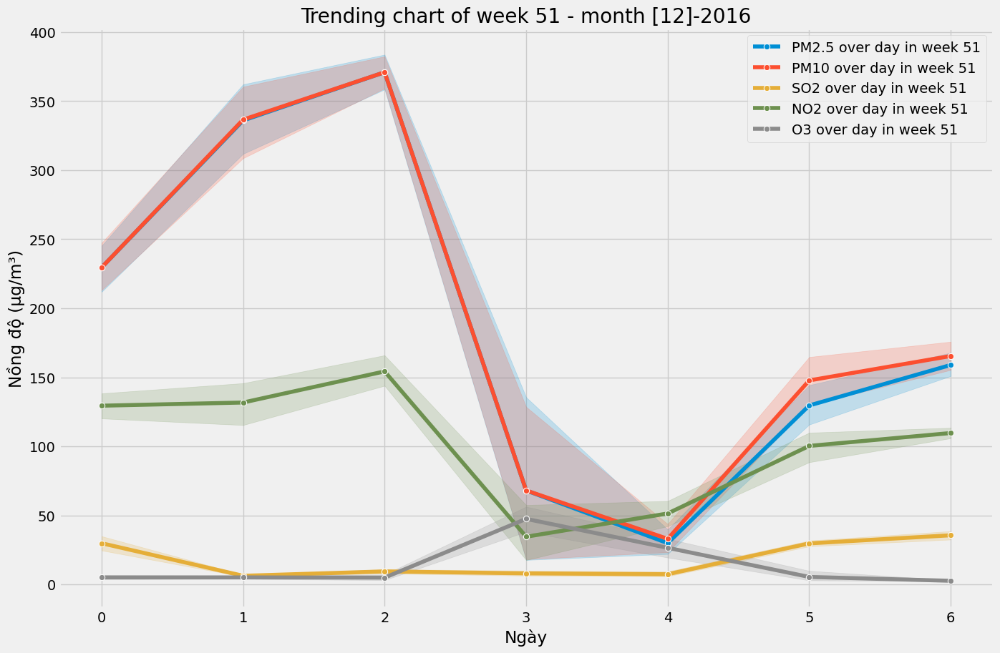

In [15]:
column = ['PM2.5', 'PM10', 'SO2', 'NO2', 'O3']
selected_year = 2016
for week in range(39, 52):
  # Lọc dữ liệu cho năm 2016 và tháng cụ thể
  filter_data = df_copy[(df_copy['week of month'] == week) & (df_copy['year'] == selected_year)]
  cur_month = filter_data['month'].unique()
  # Tạo biểu đồ theo từng tháng
  plt.figure(figsize=(15, 10))

  for col in column:
    # Sử dụng seaborn để vẽ biểu đồ line plot với màu đỏ
    sns.lineplot(x='date of week', y=col, data=filter_data, marker='o', label = f'{col} over day in week {week}')

  # Các cài đặt biểu đồ
  plt.title(f'Trending chart of week {week} - month {cur_month}-{selected_year}')
  plt.xlabel('Ngày')
  plt.ylabel('Nồng độ (µg/m³)')
  plt.grid(True)
  plt.legend()
  plt.show()

#### Hour Trending

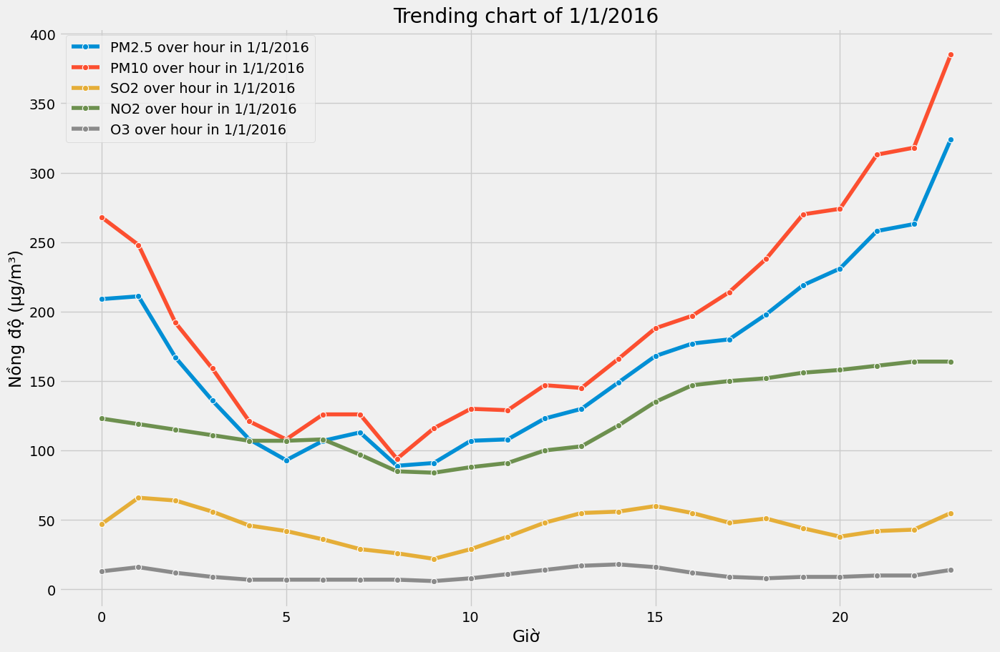

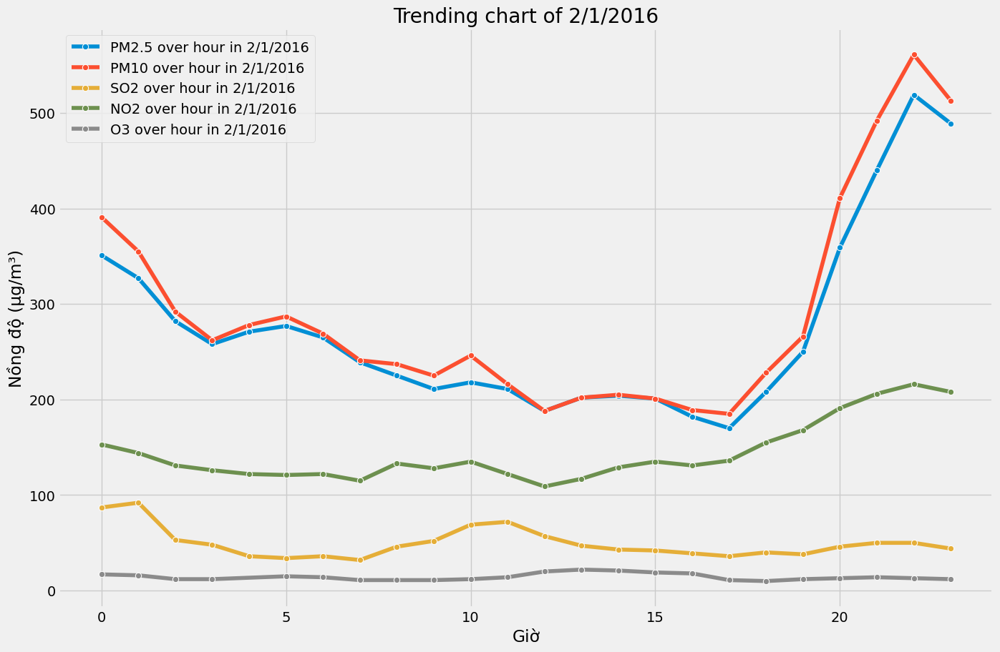

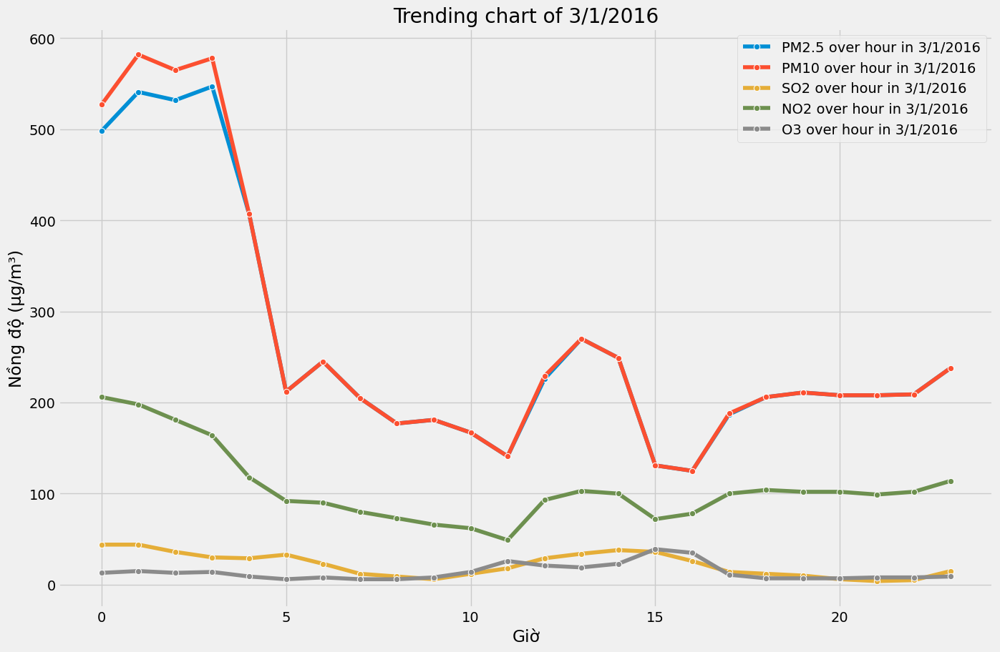

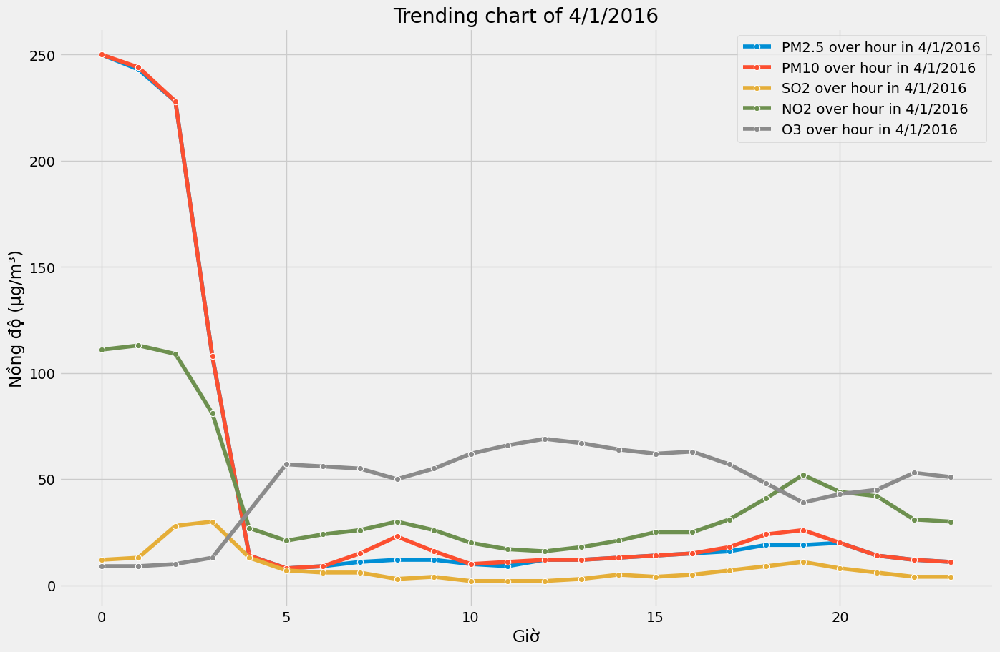

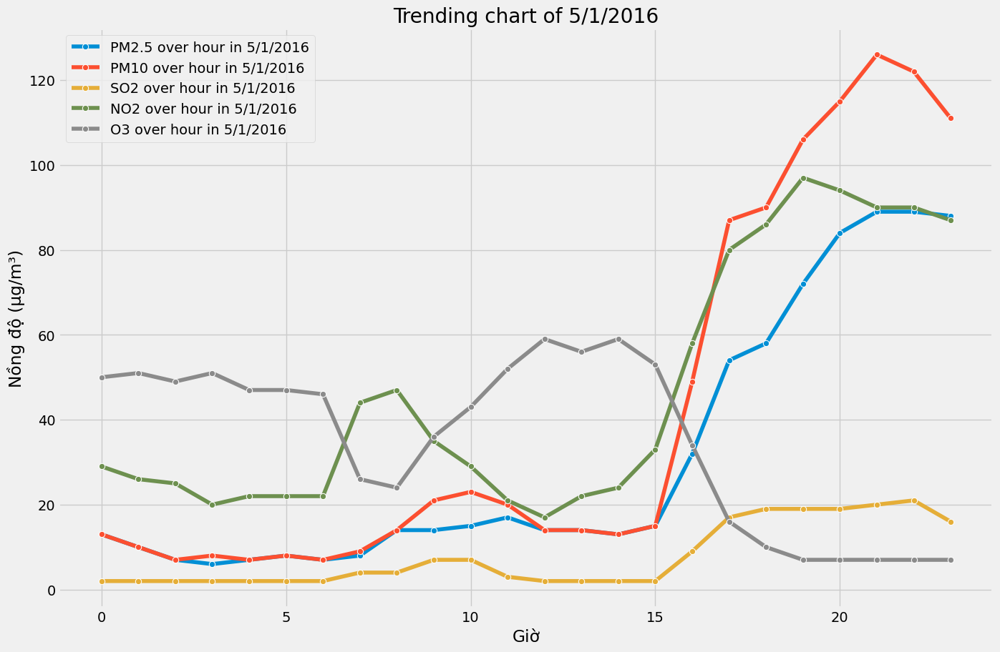

...

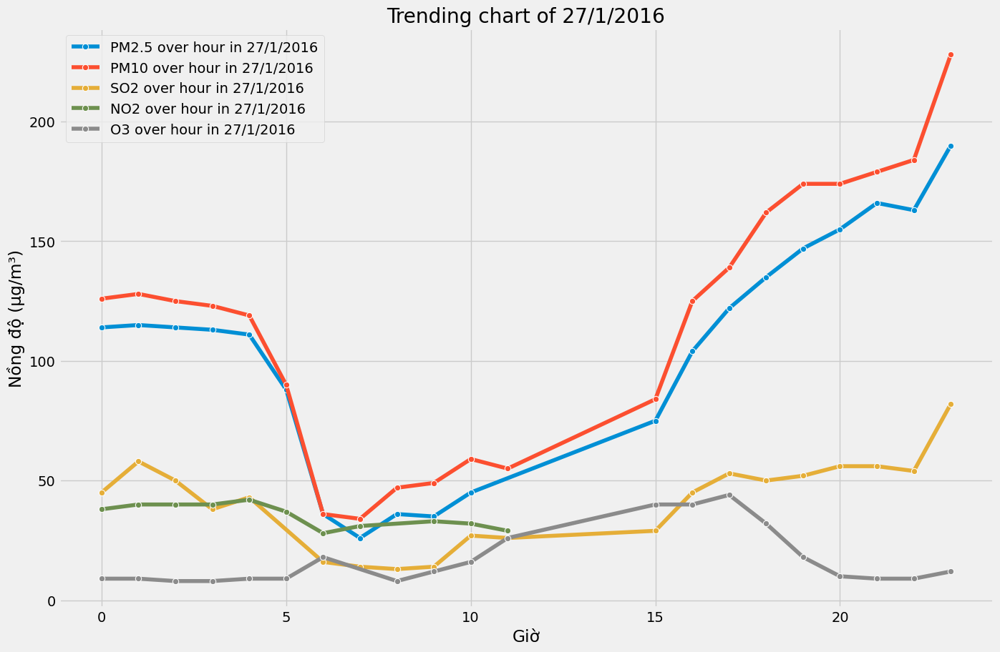

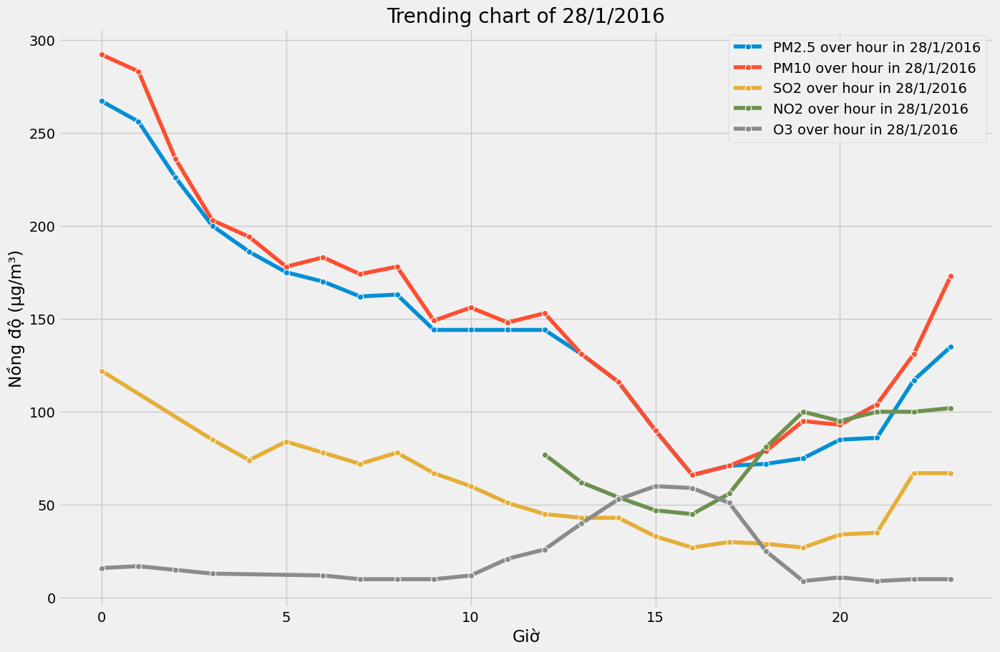

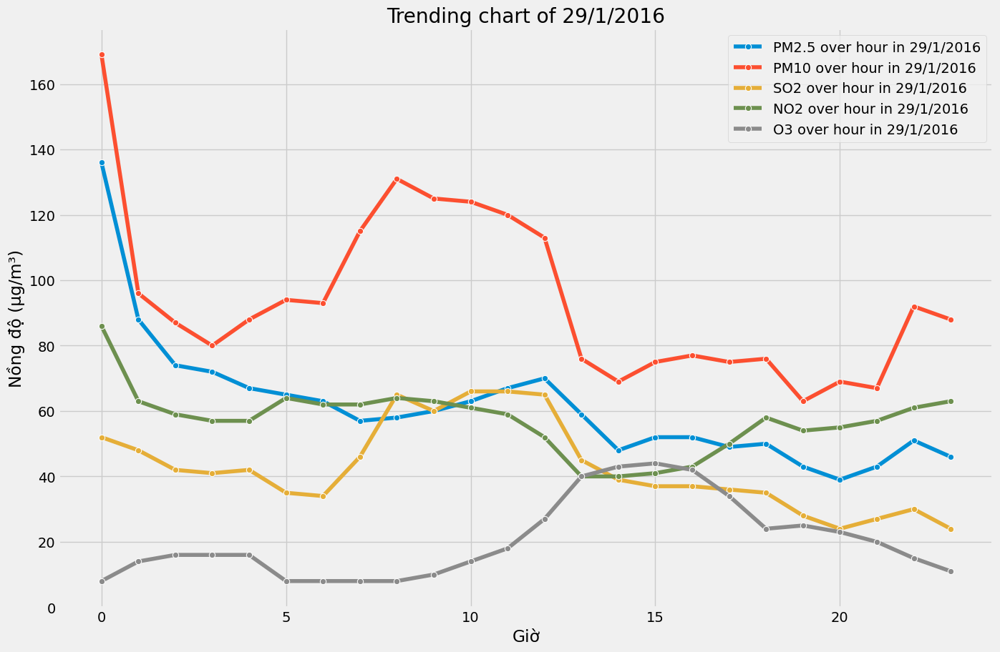

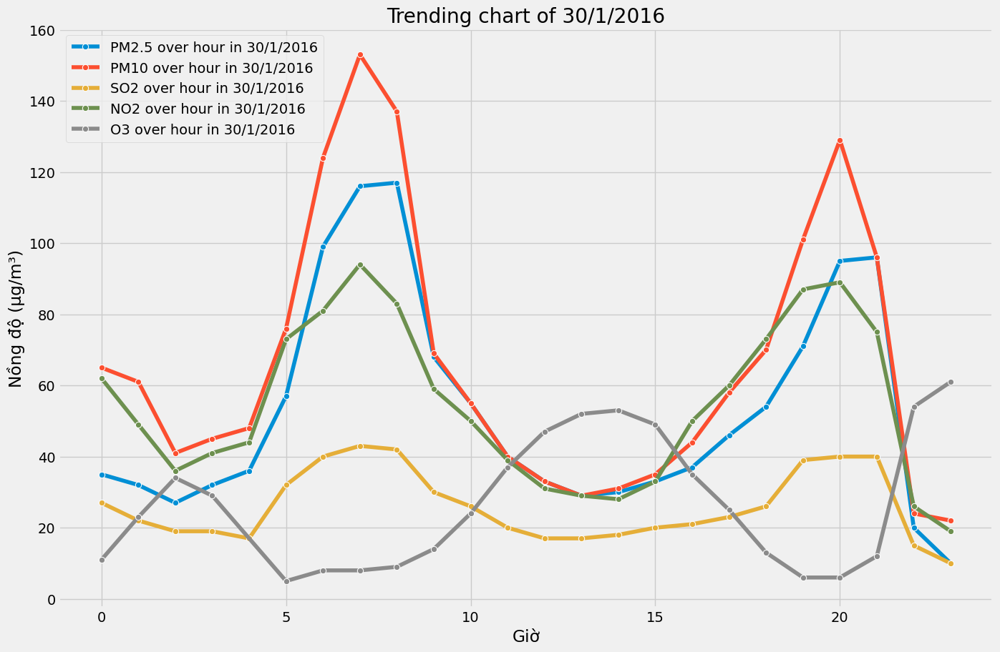

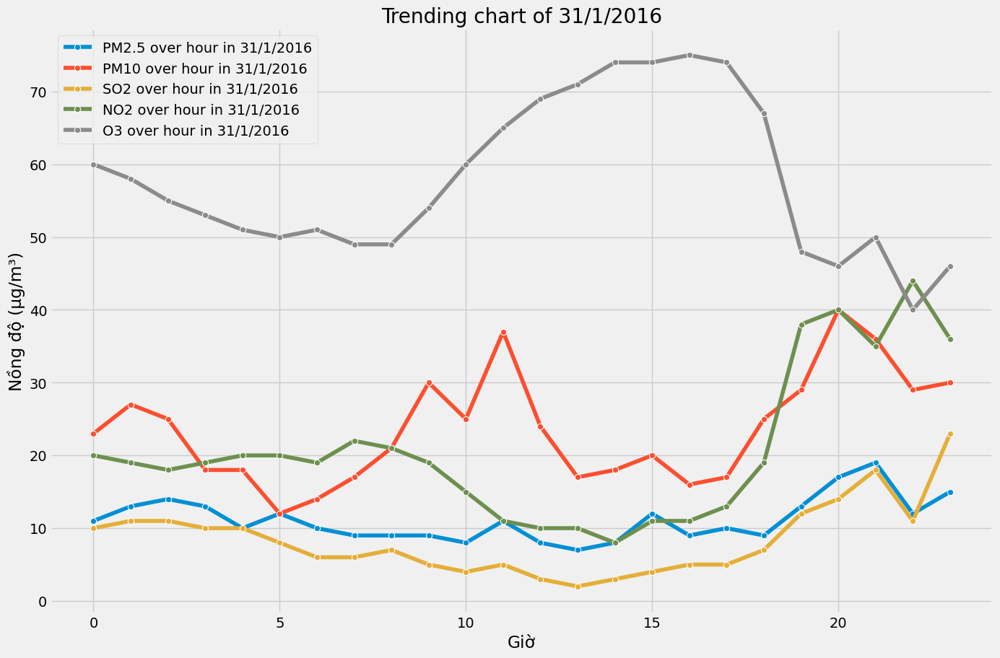

In [16]:
column = ['PM2.5', 'PM10', 'SO2', 'NO2', 'O3']
selected_year = 2016
selected_month = 1
data = df_copy[(df_copy['month'] == selected_month) & (df_copy['year'] == selected_year)]
listday = list(data['day'].unique())
listday.sort()
for day in listday:
  # Lọc dữ liệu cho năm 2016 và tháng cụ thể
  filter_data = data[data['day'] == day]
  # Tạo biểu đồ theo từng tháng
  plt.figure(figsize=(15, 10))

  for col in column:
    # Sử dụng seaborn để vẽ biểu đồ line plot với màu đỏ
    sns.lineplot(x='hour', y=col, data=filter_data, marker='o', label = f'{col} over hour in {day}/{selected_month}/{selected_year}')

  # Các cài đặt biểu đồ
  plt.title(f'Trending chart of {day}/{selected_month}/{selected_year}')
  plt.xlabel('Giờ')
  plt.ylabel('Nồng độ (µg/m³)')
  plt.grid(True)
  plt.legend()
  plt.show()

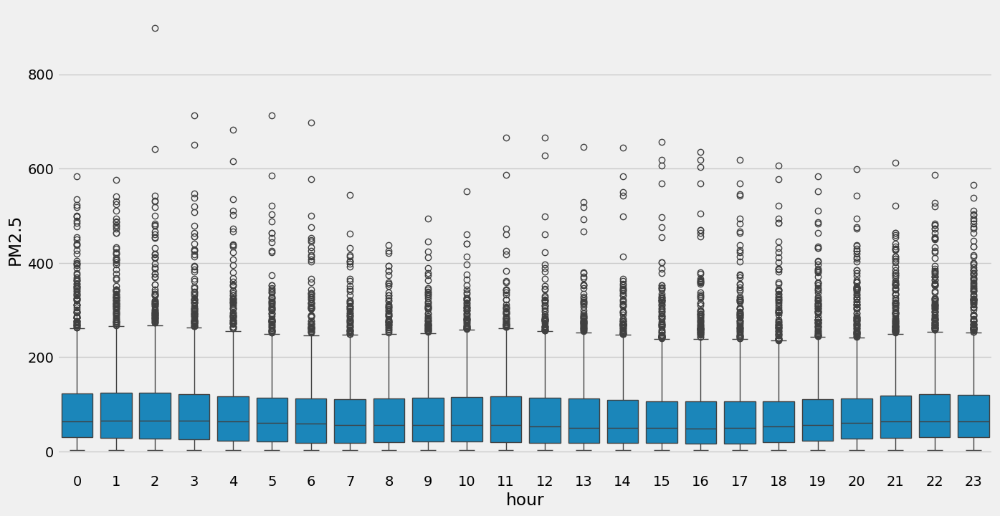

In [17]:
plt.figure(figsize = (15, 8))
sns.boxplot(x = 'hour', y = 'PM2.5', data=df_copy)
# Hiển thị biểu đồ
plt.show()

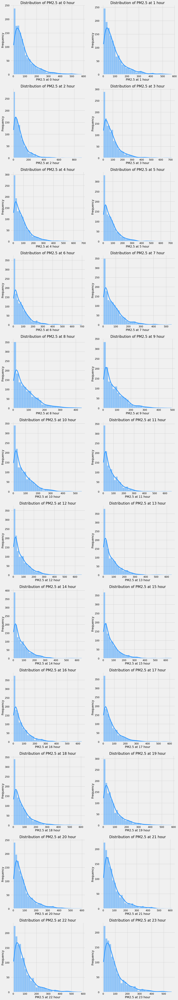

In [18]:
hourlist = df_copy['hour'].unique()
num_rows_num = (len(hourlist) - 1) // 2 + 1
hourlist.sort()
# Create subplots and hisplot for attributes
plt.figure(figsize=(15, 8 * num_rows_num))
for i,hour in enumerate(hourlist):
    df_hour = df_copy[df_copy['hour'] == hour]
    plt.subplot(num_rows_num, 2, i + 1)
    sns.histplot(df_hour['PM2.5'], kde=True, color='#3299ff')
    plt.xlabel(f'PM2.5 at {hour} hour')
    plt.ylabel('Frequency')
    plt.title(f'Distribution of PM2.5 at {hour} hour')

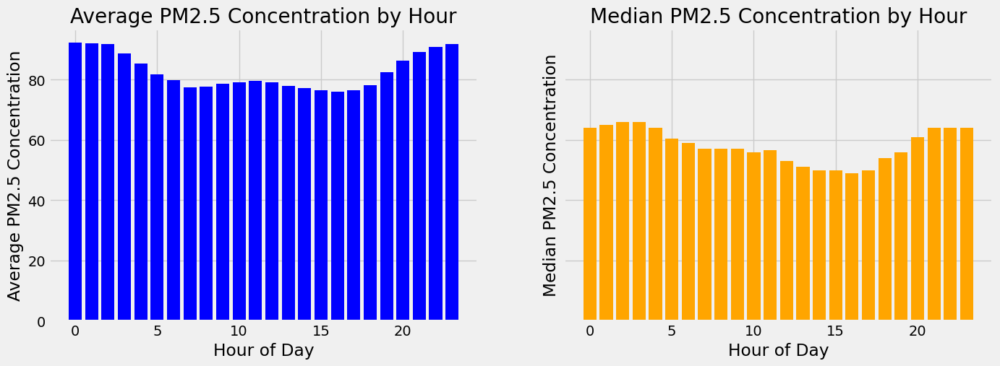

In [19]:
# Tính giá trị trung bình và trung vị
hourly_avg = df.groupby('hour')['PM2.5'].mean()
hourly_median = df.groupby('hour')['PM2.5'].median()

# Tạo subplot
fig, axs = plt.subplots(1, 2, figsize=(15, 5), sharey=True)  # 1 hàng, 2 cột

# Biểu đồ cho giá trị trung bình
axs[0].bar(hourly_avg.index, hourly_avg.values, color='blue')
axs[0].set_xlabel('Hour of Day')
axs[0].set_ylabel('Average PM2.5 Concentration')
axs[0].set_title('Average PM2.5 Concentration by Hour')

# Biểu đồ cho trung vị
axs[1].bar(hourly_median.index, hourly_median.values, color='orange')
axs[1].set_xlabel('Hour of Day')
axs[1].set_ylabel('Median PM2.5 Concentration')
axs[1].set_title('Median PM2.5 Concentration by Hour')

plt.show()


#### Nhận xét

- Nồng độ PM2.5 tương quan thuận 1 cách rõ rệch với PM10 và nghịch đối với lượng khí O3
- PM2.5 có xu hướng thấp hơn vào giữa năm (khoảng tháng 4 đến tháng 8) và tăng vào khoảng các quý đầu năm và cuối năm
- Không có một thời điểm cụ thể để xác định PM2.5 giảm trong tuần. Tuy nhiên, cứ mỗi 3 - 5 ngày, nồng độ PM2.5 sẽ tăng vọt và giảm mạnh trong 3 - 5 ngày kế tiếp
- Trong khoảng 23h00 đến 5h00 sáng, nồng độ PM2.5 giảm mạnh và tăng cao từ 15h trở đi
- Trending theo từng năm mang tính chắc chắn vì sử dụng toàn bộ dữ liệu để đánh giá xu hướng, trending theo ngày và giờ được đánh giá thông qua dữ liệu trong năm 2016 và ước lượng trending cho các năm còn lại.

### 3. Data Correlation

<ipython-input-20-6ccf5eda2a5e>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_copy.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)


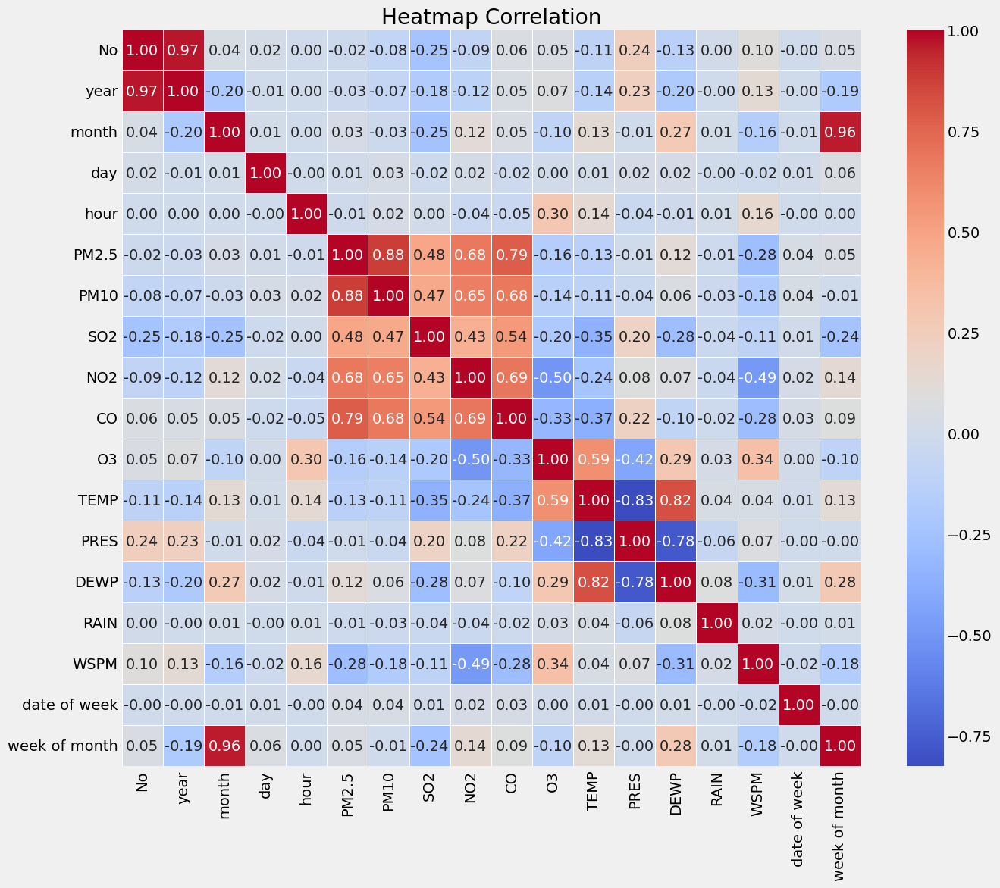

In [20]:
# Vẽ biểu đồ heatmap của ma trận tương quan
plt.figure(figsize=(14, 12))
sns.heatmap(df_copy.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Heatmap Correlation')
plt.show()

#**Preprocessing**

### 1.Encoder

- Ý tưởng sử dụng kĩ thuật  Circular Statistics được triển khai, encode hướng gió về số đo góc cụ thể và sau đó tính toán cos và sin của góc để chi tiết hóa thông tin về hướng gió, tránh mất mát thông tin như one hot encoder

In [21]:
# Bảng ánh xạ giữa các hướng gió và giá trị độ
wind_direction_mapping = {
    'N': 0,
    'NNE': 22.5,
    'NE': 45,
    'ENE': 67.5,
    'E': 90,
    'ESE': 112.5,
    'SE': 135,
    'SSE': 157.5,
    'S': 180,
    'SSW': 202.5,
    'SW': 225,
    'WSW': 247.5,
    'W': 270,
    'WNW': 292.5,
    'NW': 315,
    'NNW': 337.5
}

# Ánh xạ giá trị độ cho mỗi hướng gió
df_copy['wd'] = df_copy['wd'].map(wind_direction_mapping)

# Ánh xạ giá trị độ thành cosine và sine của góc
df_copy['wind_direction_cos'] = np.cos(np.radians(df_copy['wd']))
df_copy['wind_direction_sin'] = np.sin(np.radians(df_copy['wd']))

### 2.Handle Null Value

- InteractiveImputer được sử dụng với thuật toán BayesRidge, biểu diễn feature muốn nội suy (biến độc lập) thành hàm số của các feature khác (biến phụ thuộc)
- Tham số sử dụng:
 - n_nearest_features : số lượng n features được sử dụng có sự tương quan mạnh mẽ nhất (dựa vào correlation) đối với biến đang nội suy
 - min_value: giá trị nhỏ nhất của kết quả nội suy
 - initial_strategy: Chiến lược khởi tạo ban đầu cho quá trình nội suy

In [22]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# tạm thời loại bỏ những cột không thể nội suy
df_impu = df_copy.drop(['station'], axis = 1)

imputer = IterativeImputer(n_nearest_features = 3,
                           min_value = 0,
                           initial_strategy = 'median')

df_imputed = imputer.fit_transform(df_impu)

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [23]:
df_imputed = pd.DataFrame(df_imputed, columns = df_impu.columns)
df_imputed.isna().sum()

No                    0
year                  0
month                 0
day                   0
hour                  0
PM2.5                 0
PM10                  0
SO2                   0
NO2                   0
CO                    0
O3                    0
TEMP                  0
PRES                  0
DEWP                  0
RAIN                  0
wd                    0
WSPM                  0
date of week          0
week of month         0
wind_direction_cos    0
wind_direction_sin    0
dtype: int64

In [24]:
df_imputed = create_time_features(df_imputed)
df_imputed = df_imputed.set_index('datetime')

In [25]:
# In ra số dòng âm cho từng thuộc tính
negative_counts = (df_imputed < 0).sum()

print("Số dòng âm cho từng thuộc tính:")
print(negative_counts)

Số dòng âm cho từng thuộc tính:
No                        0
year                      0
month                     0
day                       0
hour                      0
PM2.5                     0
PM10                      0
SO2                       0
NO2                       0
CO                        0
O3                        0
TEMP                   5308
PRES                      0
DEWP                  14885
RAIN                      0
wd                        0
WSPM                      0
date of week              0
week of month             0
wind_direction_cos    14224
wind_direction_sin    13390
dtype: int64


###3.Split data

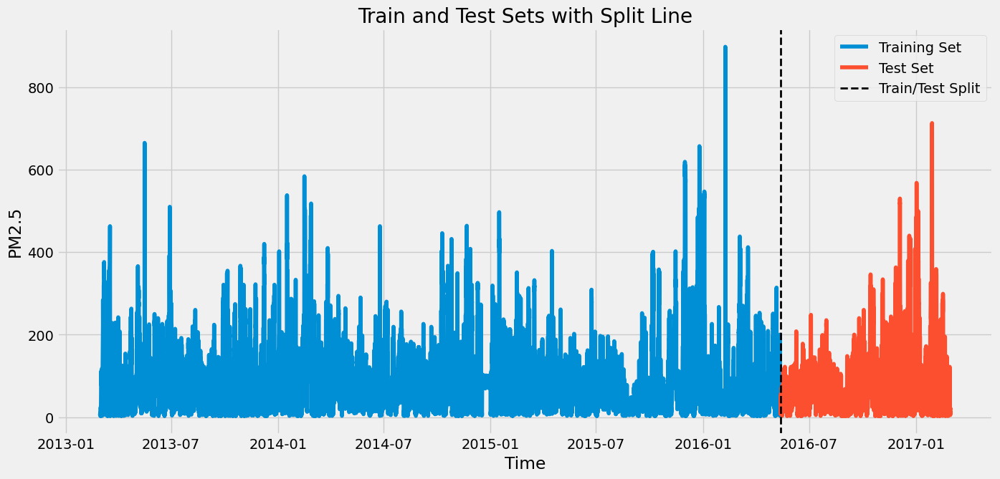

In [26]:
#df_imputed = df_imputed.drop('No', axis = 1)
test_size = round(0.2*len(df_imputed))

test_set = df_imputed.tail(test_size)
train_set = df_imputed.iloc[:-test_size]
X_train = train_set.drop('PM2.5', axis = 1)
X_test = test_set.drop('PM2.5', axis = 1)
y_train = train_set['PM2.5']
y_test = test_set['PM2.5']

# Calculate the index where the training set ends and the test set begins
split_index = train_set.index.max()

# Visualize the train and test sets on the same plot with a separating line
plt.figure(figsize=(15, 7))
plt.plot(train_set.index, train_set['PM2.5'], label='Training Set')
plt.plot(test_set.index, test_set['PM2.5'], label='Test Set')

plt.axvline(split_index, color='black', linestyle='--', linewidth=2, label='Train/Test Split')

plt.title('Train and Test Sets with Split Line')
plt.xlabel('Time')
plt.ylabel('PM2.5')
plt.legend()
plt.show()

### 4.Function

In [27]:
def nash_sutcliffe_efficiency(y_test, y_pred):
    y_test = np.array(y_test)
    y_pred = np.array(y_pred)

    # Tính NSE
    numerator = np.sum((y_test - y_pred) ** 2)
    denominator = np.sum((y_test - np.mean(y_test)) ** 2)

    nse = 1 - (numerator / denominator)

    return nse

In [28]:
def evaluate(y_test, y_pred):
  mse = mean_squared_error(y_test, y_pred)
  rmse = mean_squared_error(y_test, y_pred, squared=False)
  mae = mean_absolute_error(y_test, y_pred)
  r2 = r2_score(y_test, y_pred)
  nse = nash_sutcliffe_efficiency(y_test, y_pred)

  # Lưu các giá trị vào dictionary
  results = {
      'Mean Squared Error (MSE)': mse,
      'Root Mean Squared Error (RMSE)': rmse,
      'Mean Absolute Error (MAE)': mae,
      'R2 Score': r2,
      'Nash-Sutcliffe Efficiency': nse
  }
  return results

In [29]:
def draw_result(y_test, y_pred, y_tun_pred):
  # Plot Actual vs Default Parameters
  plt.figure(figsize=(15, 8))
  plt.plot(y_test.index, y_test, label='Actual')
  plt.plot(y_test.index, y_pred, label='Predicted')
  plt.title('Actual vs Default Parameters')
  plt.xlabel('Time')
  plt.ylabel('PM2.5')
  plt.legend()
  plt.show()

  # Plot Actual vs Tuned Parameters
  plt.figure(figsize=(15, 8))
  plt.plot(y_test.index, y_test, label='Actual', linestyle='-', color='blue')
  plt.plot(y_test.index, y_tun_pred, label='Tuned Parameters', linestyle='-', color='green')
  plt.xlabel('Index of Test Samples')
  plt.ylabel('PM2.5 Concentration')
  plt.legend()
  plt.title('Actual vs Tuned Parameters')
  plt.grid(True)
  plt.show()

  # Plot Default Parameters vs Tuned Parameters
  plt.figure(figsize=(15, 8))
  plt.plot(y_test.index, y_pred, label='Default Parameters', linestyle='-', color='orange')
  plt.plot(y_test.index, y_tun_pred, label='Tuned Parameters', linestyle='-', color='green')
  plt.xlabel('Index of Test Samples')
  plt.ylabel('PM2.5 Concentration')
  plt.legend()
  plt.title('Default Parameters vs Tuned Parameters')
  plt.grid(True)
  plt.show()

  # Chuyển đổi observed và predicted thành mảng numpy để dễ xử lý
  observed = np.array(y_test)
  predicted = np.array(y_pred)
  tun_predicted = np.array(y_tun_pred)

  # Tạo mảng chứa giá trị của đường thẳng hoàn hảo
  perfect_line = np.linspace(min(observed), max(observed), len(observed))

  # Tạo subplot
  fig, axs = plt.subplots(1, 2, figsize=(15, 8), sharey=True)  # 1 hàng, 2 cột
  # Vẽ biểu đồ với tham số mặc định
  axs[0].scatter(observed, predicted, label='Predict vs Actual')
  axs[0].plot(perfect_line, perfect_line, color='red', label='Perfect Line')
  axs[0].set_xlabel('Actual')
  axs[0].set_ylabel('Predict by default Parameter')
  axs[0].legend()
  axs[0].set_title('Predict by default Parameter with Perfect Line')

  # Biểu đồ kết quả tinh chỉnh
  axs[1].scatter(observed, tun_predicted, label='Predict vs Actual')
  axs[1].plot(perfect_line, perfect_line, color='red', label='Perfect Line')
  axs[1].set_xlabel('Actual')
  axs[1].set_ylabel('Predict by tunning Parameter')
  axs[1].legend()
  axs[1].set_title('Predict by tunning Parameter with Perfect Line')

  plt.show()

In [30]:
def cross_validation_timeSeries(model, split, df):
  tss = TimeSeriesSplit(n_splits=split)
  df = df.sort_index()

  fold = 0
  preds = []
  mse = []
  rmse = []
  mae = []
  r2 = []
  nse = []

  fold = 0
  #fig, axs = plt.subplots(5, 1, figsize=(15, 15), sharex=True)
  for train_idx, val_idx in tss.split(df):
      # lọc dữ liệu
      train = df.iloc[train_idx]
      test = df.iloc[val_idx]

      # # trực quan hóa từng fold
      # train['PM2.5'].plot(ax=axs[fold],
      #                     label='Training Set',
      #                     title=f'Data Train/Test Split Fold {fold}')
      # test['PM2.5'].plot(ax=axs[fold],
      #                   label='Test Set')
      # axs[fold].axvline(test.index.min(), color='black', ls='--')
      # fold += 1
      # thực hiện quá trình train và test cho từng fold
      X_train = train.drop('PM2.5', axis = 1)
      y_train = train['PM2.5']

      X_test = test.drop('PM2.5', axis = 1)
      y_test = test['PM2.5']

      reg = model
      reg.fit(X_train, y_train)
      y_pred = reg.predict(X_test)

      # gọi hàm đánh giá và lấy từng thông số đánh giá
      preds.append(y_pred)
      scores = evaluate(y_test, y_pred)
      mse.append(scores['Mean Squared Error (MSE)'])
      rmse.append(scores['Root Mean Squared Error (RMSE)'])
      mae.append(scores['Mean Absolute Error (MAE)'])
      r2.append(scores['R2 Score'])
      nse.append(scores['Nash-Sutcliffe Efficiency'])

  plt.show()
  results = {
      'Mean Squared Error (MSE) each fold': mse,
      'Root Mean Squared Error (RMSE) each fold': rmse,
      'Mean Absolute Error (MAE) each fold': mae,
      'R2 Score each fold': r2,
      'Nash-Sutcliffe Efficiency each fold': nse
   }
  return results

In [31]:
from sklearn.metrics import SCORERS

# Print all available scoring metrics
print("Available Scoring Metrics:")
for scorer in SCORERS.keys():
    print(scorer)

Available Scoring Metrics:
explained_variance
r2
max_error
matthews_corrcoef
neg_median_absolute_error
neg_mean_absolute_error
neg_mean_absolute_percentage_error
neg_mean_squared_error
neg_mean_squared_log_error
neg_root_mean_squared_error
neg_mean_poisson_deviance
neg_mean_gamma_deviance
accuracy
top_k_accuracy
roc_auc
roc_auc_ovr
roc_auc_ovo
roc_auc_ovr_weighted
roc_auc_ovo_weighted
balanced_accuracy
average_precision
neg_log_loss
neg_brier_score
positive_likelihood_ratio
neg_negative_likelihood_ratio
adjusted_rand_score
rand_score
homogeneity_score
completeness_score
v_measure_score
mutual_info_score
adjusted_mutual_info_score
normalized_mutual_info_score
fowlkes_mallows_score
precision
precision_macro
precision_micro
precision_samples
precision_weighted
recall
recall_macro
recall_micro
recall_samples
recall_weighted
f1
f1_macro
f1_micro
f1_samples
f1_weighted
jaccard
jaccard_macro
jaccard_micro
jaccard_samples
jaccard_weighted


In [32]:
def rmse_for_bayes(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    return -np.sqrt(mse)

In [33]:
def bayes_tunning(model, space, X, y):
  param_space = space
  np.int = np.int_
  reg = model

  splitter = TimeSeriesSplit(n_splits = 5)

  scorer = make_scorer(rmse_for_bayes)

  np.int = np.int_

  bayes_opt = BayesSearchCV(estimator = reg,
                            search_spaces = param_space,
                            cv = splitter,
                            # n_points = 5,
                            # n_iter = 50,
                            scoring = scorer)
  bayes_opt.fit(X, y)

  print(f'best score:{bayes_opt.best_score_} with {bayes_opt.best_params_}')

  return bayes_opt

#**Random Forest**

### Base Model

In [34]:
reg = RandomForestRegressor()
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)

In [35]:
# Sử dụng hàm để đánh giá mô hình và in kết quả
evaluation_results = evaluate(y_test, y_pred)
for metric, value in evaluation_results.items():
    print(f'{metric}: {value}')

Mean Squared Error (MSE): 470.58753629837094
Root Mean Squared Error (RMSE): 21.69302967080373
Mean Absolute Error (MAE): 14.434577213459116
R2 Score: 0.9323357330313715
Nash-Sutcliffe Efficiency: 0.9323357330313715


## Tunning Hyper Parameter

In [36]:
RandomForestRegressor().get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [37]:
# # lower than 22.5
# param_space = {
#     'n_estimators': (100, 300),
#     'max_depth': (10, 50),
#     'max_features': (0.1, 1.0),
#     'min_samples_split': (2, 20),
#     'min_samples_leaf': (1, 10)
# }

# reg = RandomForestRegressor()

# result_tunning = bayes_tunning(reg, param_space, X_train, y_train)

best score:-29.374410299232977 with OrderedDict([('max_depth', 50), ('max_features', 0.7621284538897536), ('min_samples_leaf', 10), ('min_samples_split', 20), ('n_estimators', 100)])


## Final Model

In [38]:
#best score:-29.374410299232977 with OrderedDict([('max_depth', 50), ('max_features', 0.7621284538897536), ('min_samples_leaf', 10), ('min_samples_split', 20), ('n_estimators', 100)])#
reg_opt = RandomForestRegressor(max_depth = 11,
                                max_features = 0.5466821664233133,
                                min_samples_leaf = 10,
                                min_samples_split = 13,
                                n_estimators = 100)
reg_opt.fit(X_train, y_train)
y_pred_opt = reg_opt.predict(X_test)

In [39]:
# Sử dụng hàm để đánh giá mô hình và in kết quả
evaluation_results = evaluate(y_test, y_pred_opt)
for metric, value in evaluation_results.items():
    print(f'{metric}: {value}')

Mean Squared Error (MSE): 432.8487782116
Root Mean Squared Error (RMSE): 20.805018101688834
Mean Absolute Error (MAE): 13.085108458271328
R2 Score: 0.9377620675712406
Nash-Sutcliffe Efficiency: 0.9377620675712406


In [40]:
cross_val_result = cross_validation_timeSeries(reg_opt, 5, df_imputed)
for metric, value in cross_val_result.items():
    print(f'{metric}: {value}')
    print(f'Mean of {metric}: {np.mean(value)}')

Mean Squared Error (MSE) each fold: [997.7885929799172, 537.8938505553785, 606.3537338788958, 943.8011672443228, 506.7750569902195]
Mean of Mean Squared Error (MSE) each fold: 718.5224803297467
Root Mean Squared Error (RMSE) each fold: [31.58779183450336, 23.19253868284752, 24.624250930310467, 30.721347093581734, 22.51166490933577]
Mean of Root Mean Squared Error (RMSE) each fold: 26.527518690115766
Mean Absolute Error (MAE) each fold: [19.80357881559859, 16.012373840234485, 16.970328110632646, 16.332791243938143, 13.311069453109619]
Mean of Mean Absolute Error (MAE) each fold: 16.4860282927027
R2 Score each fold: [0.8552195194604548, 0.9138554992576231, 0.8387362433778968, 0.8975068071359295, 0.9360706375317978]
Mean of R2 Score each fold: 0.8882777413527403
Nash-Sutcliffe Efficiency each fold: [0.8552195194604548, 0.9138554992576231, 0.8387362433778968, 0.8975068071359295, 0.9360706375317978]
Mean of Nash-Sutcliffe Efficiency each fold: 0.8882777413527403


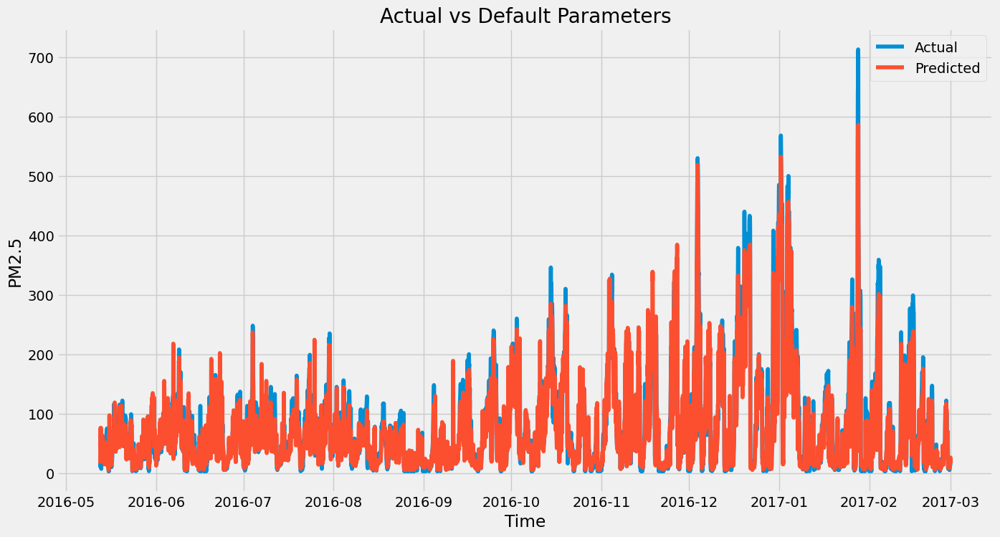

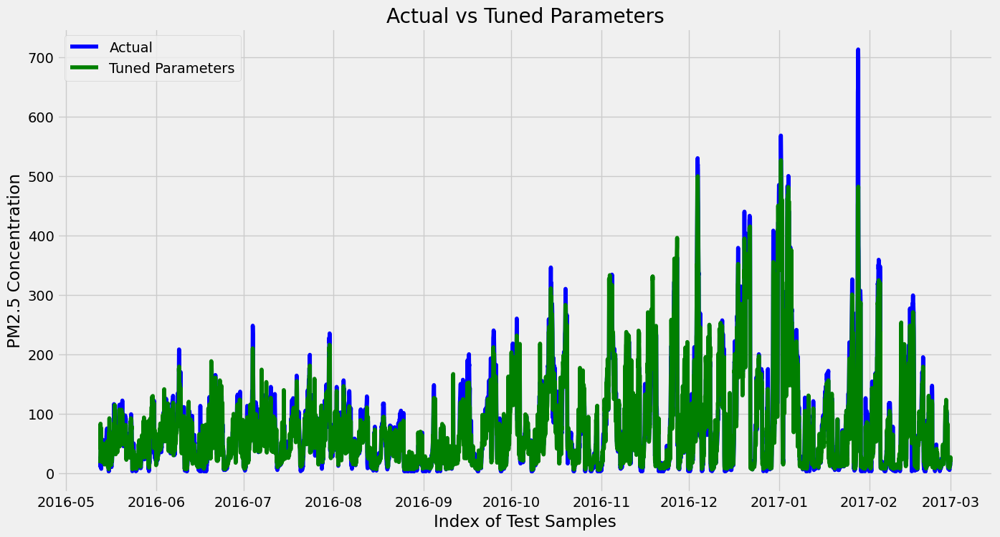

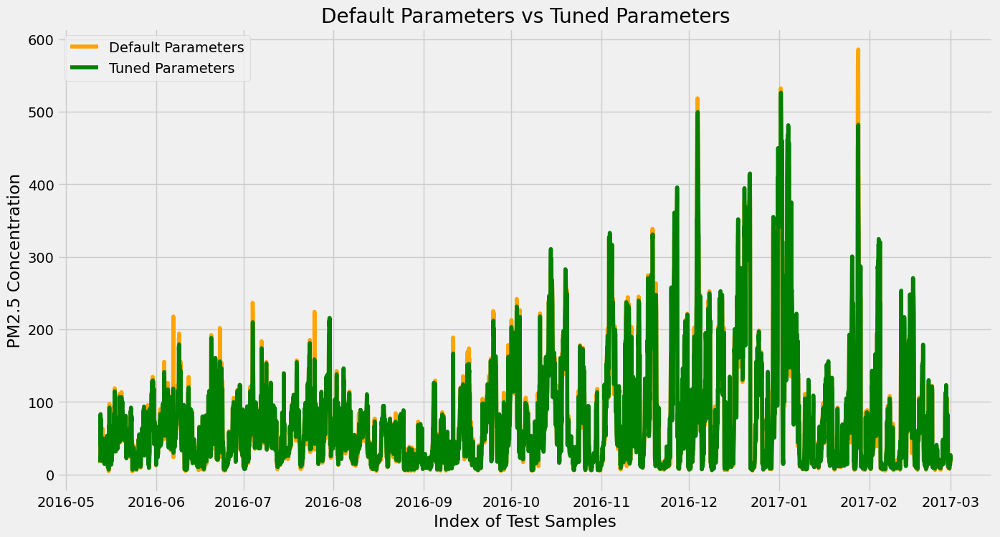

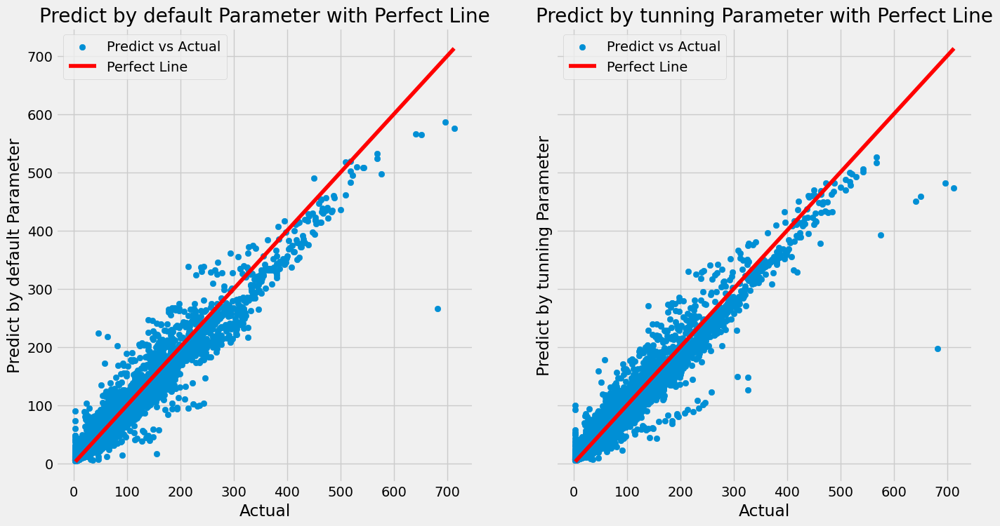

In [41]:
draw_result(y_test, y_pred, y_pred_opt)

# XGBoost

In [42]:
reg_boost = XGBRegressor()
reg_boost.fit(X_train, y_train)
y_pred = reg_boost.predict(X_test)

In [43]:
# Sử dụng hàm để đánh giá mô hình và in kết quả
evaluation_results = evaluate(y_test, y_pred)
for metric, value in evaluation_results.items():
    print(f'{metric}: {value}')

Mean Squared Error (MSE): 677.0171470419986
Root Mean Squared Error (RMSE): 26.019553167608365
Mean Absolute Error (MAE): 16.263210499133955
R2 Score: 0.9026538838233409
Nash-Sutcliffe Efficiency: 0.9026538838233409


In [44]:
# param_space = {
#     'learning_rate': (0.01, 1.0, 'log-uniform'),
#     'n_estimators': (50, 200),
#     'max_depth': (1, 10),
#     'min_child_weight': (1, 10),
#     'subsample': (0.1, 1.0),
#     'colsample_bytree': (0.1, 1.0),
#     'gamma': (0.0, 1.0),
# }

# reg = XGBRegressor()

# result_tunning = bayes_tunning(reg, param_space, X_train, y_train)

best score:-30.000278244680622 with OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.0), ('learning_rate', 0.029008548874342715), ('max_depth', 3), ('min_child_weight', 1), ('n_estimators', 200), ('subsample', 0.1)])


In [45]:
#best score:-30.000278244680622 with OrderedDict([('colsample_bytree', 1.0), ('gamma', 0.0), ('learning_rate', 0.029008548874342715), ('max_depth', 3), ('min_child_weight', 1), ('n_estimators', 200), ('subsample', 0.1)])
reg_opt = XGBRegressor(colsample_bytree = 1.0,
                        gamma = 0.33760427278998795,
                        learning_rate = 0.05294014436061186,
                        max_depth = 2,
                        min_child_weight = 4,
                        n_estimators = 100,
                        subsample = 0.5911064222539284)
reg_opt.fit(X_train, y_train)
y_pred_opt = reg_opt.predict(X_test)

In [46]:
# Sử dụng hàm để đánh giá mô hình và in kết quả
evaluation_results = evaluate(y_test, y_pred_opt)
for metric, value in evaluation_results.items():
    print(f'{metric}: {value}')

Mean Squared Error (MSE): 577.2147705080739
Root Mean Squared Error (RMSE): 24.02529438962349
Mean Absolute Error (MAE): 15.71799692643159
R2 Score: 0.9170041462697593
Nash-Sutcliffe Efficiency: 0.9170041462697593


In [47]:
cross_val_result = cross_validation_timeSeries(reg_opt, 5, df_imputed)
for metric, value in cross_val_result.items():
    print(f'{metric}: {value}')
    print(f'Mean of {metric}: {np.mean(value)}')

Mean Squared Error (MSE) each fold: [1129.3516122295891, 629.6901230195651, 730.0647396630436, 1016.5990904493627, 630.1722958015466]
Mean of Mean Squared Error (MSE) each fold: 827.1755722326216
Root Mean Squared Error (RMSE) each fold: [33.60582705766351, 25.093627139566035, 27.01971020686646, 31.88415108559992, 25.103232775910488]
Mean of Root Mean Squared Error (RMSE) each fold: 28.54130965312128
Mean Absolute Error (MAE) each fold: [21.93624085137735, 17.82632222245178, 19.44053834728698, 17.64431146522342, 15.998403237562053]
Mean of Mean Absolute Error (MAE) each fold: 18.56916322478032
R2 Score each fold: [0.8361295466122842, 0.8991541895972249, 0.8058344891483518, 0.8896012314255887, 0.9205041515756885]
Mean of R2 Score each fold: 0.8702447216718276
Nash-Sutcliffe Efficiency each fold: [0.8361295466122842, 0.8991541895972249, 0.8058344891483518, 0.8896012314255887, 0.9205041515756885]
Mean of Nash-Sutcliffe Efficiency each fold: 0.8702447216718276


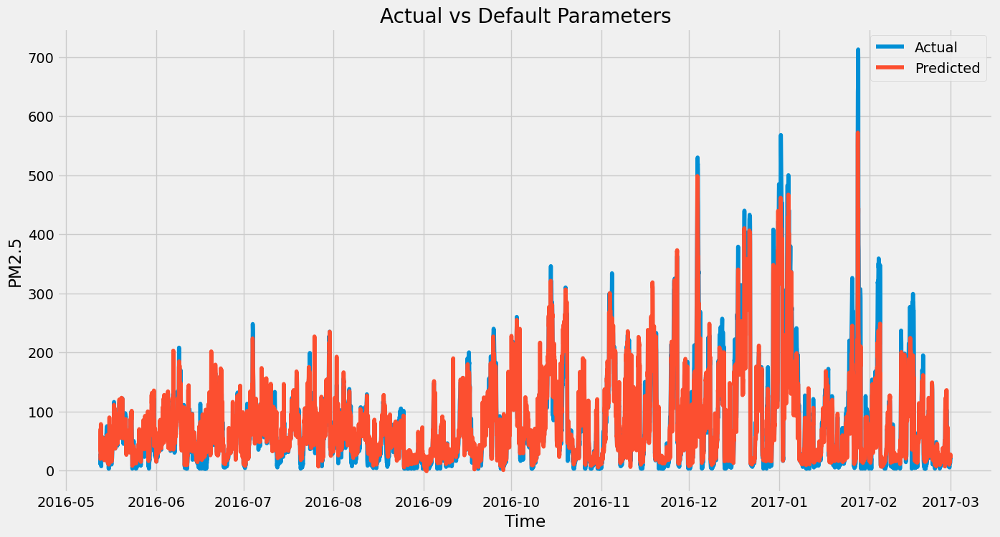

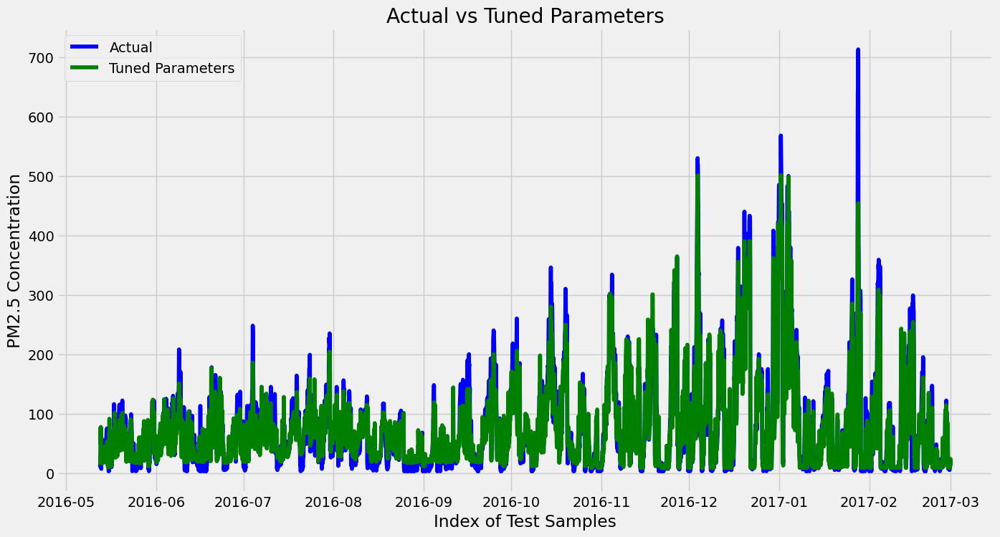

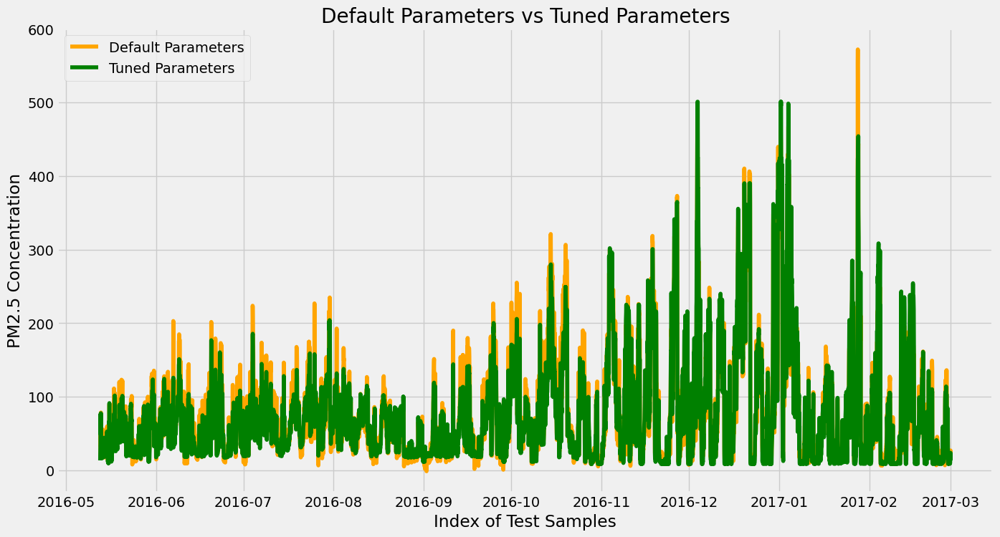

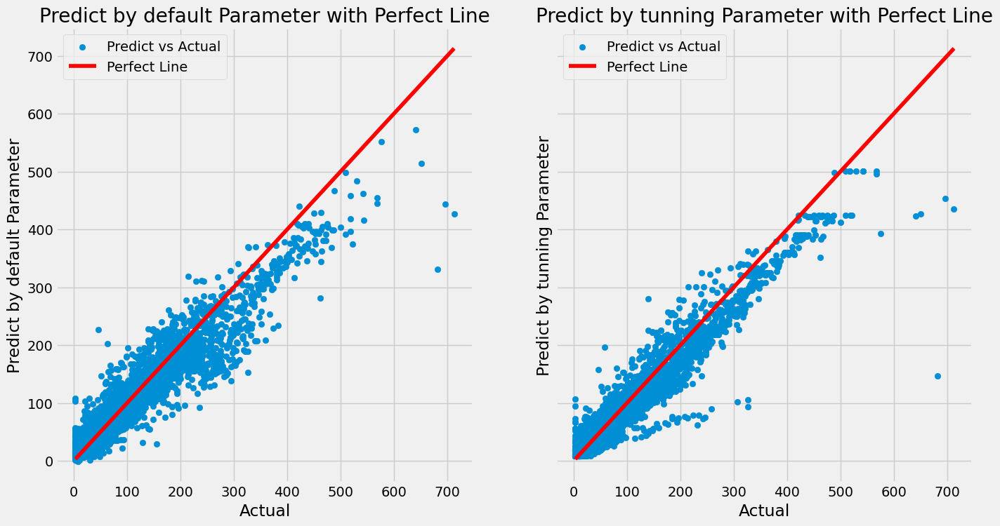

In [48]:
draw_result(y_test, y_pred, y_pred_opt)